In [1]:
#importing necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import nltk
import re
import string
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.tokenize import word_tokenize, sent_tokenize
from wordcloud import WordCloud, STOPWORDS

# Dataset 1

In [2]:
dataset1 = pd.read_csv("Downloads/Fake_news_Detection-main/Data_set_1/news/news.csv")

In [3]:
dataset1.head()

,Unnamed: 0,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL


In [4]:
dataset1.isnull().sum()

Unnamed: 0    0
title         0
text          0
label         0
dtype: int64

In [5]:
dataset1.label[dataset1.label=="FAKE"]=0
dataset1.label[dataset1.label=="REAL"]=1

/var/folders/w3/rh6xzdrn25x7qtbbwjf7pm3m0000gn/T/ipykernel_47675/2636179133.py:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  dataset1.label[dataset1.label=="FAKE"]=0
/var/folders/w3/rh6xzdrn25x7qtbbwjf7pm3m0000gn/T/ipykernel_47675/2636179

In [6]:
dataset1["Article"] = dataset1["title"] + dataset1["text"]

In [7]:
dataset1.shape

(6335, 5)

In [8]:
dataset1.head()

,Unnamed: 0,title,text,label,Article
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",0,"You Can Smell Hillary’s FearDaniel Greenfield,..."
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,0,Watch The Exact Moment Paul Ryan Committed Pol...
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,1,Kerry to go to Paris in gesture of sympathyU.S...
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",0,Bernie supporters on Twitter erupt in anger ag...
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,1,The Battle of New York: Why This Primary Matte...


In [9]:
#both columns combined together
dataset1.iloc[0:1,4].head()

0    You Can Smell Hillary’s FearDaniel Greenfield,...
Name: Article, dtype: object

In [10]:
dataset1 = dataset1.loc[:,['Article','label']]

In [11]:
dataset1.head()

,Article,label
0,"You Can Smell Hillary’s FearDaniel Greenfield,...",0
1,Watch The Exact Moment Paul Ryan Committed Pol...,0
2,Kerry to go to Paris in gesture of sympathyU.S...,1
3,Bernie supporters on Twitter erupt in anger ag...,0
4,The Battle of New York: Why This Primary Matte...,1


In [12]:
dataset1.sample(frac = 1) #Shuffle 100%

,Article,label
5982,Indian princess watches over rare paleontologi...,0
1745,Rand Paul Supporters Walk Out Of Jeb Bush Spee...,1
156,Obama Inches Closer to Veto-Proof Support for ...,1
3106,"To finish MLK's work, face up to racism (Opini...",1
5263,French Jews urged to rally over UNESCO resolut...,0
...,...,...
1503,Gary Johnson can’t name a single foreign leade...,1
584,Hillary’s “Big Tent” is Obama’s “Grand Bargain...,0
6115,Arkansas Republicans Put The Word “Liar” In Hi...,0
1140,"BREAKING : LGBT Group Endorses Trump, Says, “H...",0


In [13]:
def wordpre(text):
    text = text.lower()
    text = re.sub(r'\[.*?\]', '', text)                       # Removes text in square brackets
    text = re.sub(r'\W', ' ', text)                           # Removes all non-word characters
    text = re.sub(r'https?://\S+|www\.\S+', '', text)         # Removes URLs
    text = re.sub(r'<.*?>+', '', text)                        # Removes HTML tags
    text = re.sub(r'[%s]' % re.escape(string.punctuation), '', text)  # Removes punctuation
    text = re.sub(r'\n', '', text)                            # Removes newline characters
    text = re.sub(r'\w*\d\w*', '', text)                      # Removes words containing numbers
    return text


In [14]:
##  Applying the wordpre method to the dataset
dataset1['Article']=dataset1['Article'].apply(wordpre)

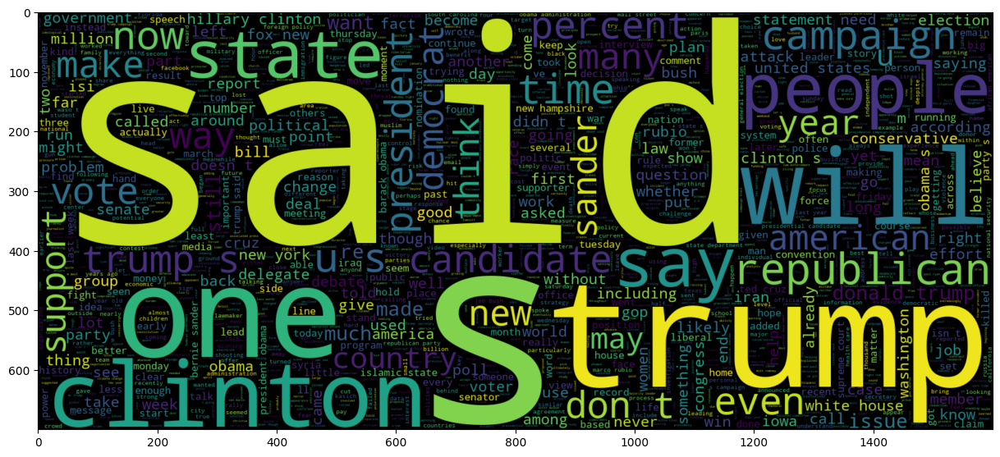

In [15]:
#word used in Real news 
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(dataset1[dataset1.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

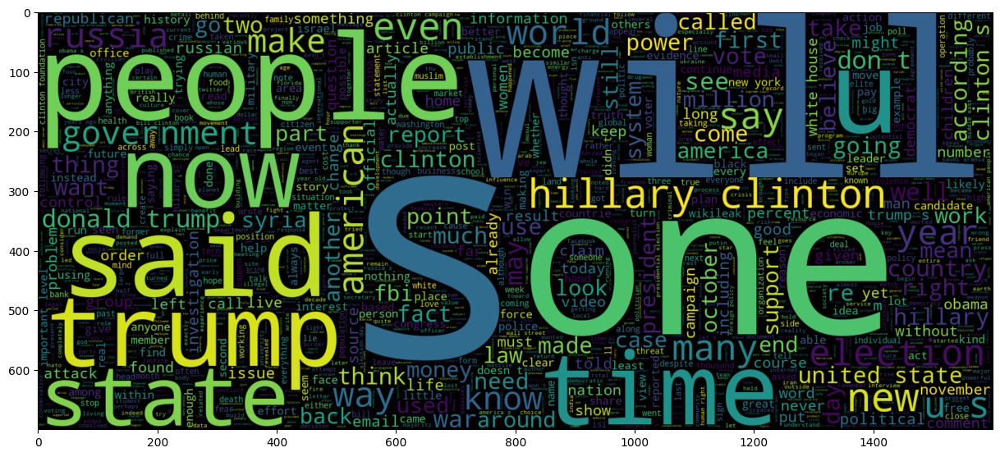

In [17]:
#word used in Fake news 
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(dataset1[dataset1.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 2

In [18]:
dataset2_fake = pd.read_csv("Downloads/Fake_news_Detection-main/Data_set_2/Fake.csv")
dataset2_true = pd.read_csv("Downloads/Fake_news_Detection-main/Data_set_2/True.csv")

In [19]:
dataset2_fake["label"] = 0
dataset2_true["label"] = 1

In [20]:
dataset2_fake["Article"] = dataset2_fake["title"] + dataset2_fake["text"]
dataset2_true["Article"] = dataset2_true["title"] + dataset2_true["text"]

In [21]:
dataset2_fake = dataset2_fake[["Article", "label"]]
dataset2_true = dataset2_true[["Article", "label"]]

In [22]:
dataset2_fake.head()

,Article,label
0,Donald Trump Sends Out Embarrassing New Year’...,0
1,Drunk Bragging Trump Staffer Started Russian ...,0
2,Sheriff David Clarke Becomes An Internet Joke...,0
3,Trump Is So Obsessed He Even Has Obama’s Name...,0
4,Pope Francis Just Called Out Donald Trump Dur...,0


In [23]:
dataset2_true.head()

,Article,label
0,"As U.S. budget fight looms, Republicans flip t...",1
1,U.S. military to accept transgender recruits o...,1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,1
3,FBI Russia probe helped by Australian diplomat...,1
4,Trump wants Postal Service to charge 'much mor...,1


In [24]:
dataset2 = pd.concat([dataset2_fake, dataset2_true])

In [25]:
dataset2.sample(frac = 1) #shuffle 100%

,Article,label
11818,Islamic State claims air base attack in Egypt'...,1
20517,"Pope, in Medellin, recalls 'painful memory' of...",1
8902,Clinton raises $68.5 million in June: campaign...,1
22544,Orlando Mass Shooting & The Accelerated Police...,0
7649,FBI found Clinton-related emails on devices be...,1
...,...,...
18407,U.S. denies breaking into Russian diplomatic a...,1
32,House panel asks Trump ex-top aide Bannon to t...,1
3315,Trump’s Cabinet Is Record-Breaking — In The W...,0
14189,AFTER GM’S TAXPAYER BAILOUT AND $10 BILLION IN...,0


In [26]:
dataset2.isnull().sum()

Article    0
label      0
dtype: int64

In [27]:
dataset2.shape

(44898, 2)

In [28]:
##  Applying the wordpre method to the dataset
dataset2['Article']=dataset2['Article'].apply(wordpre)

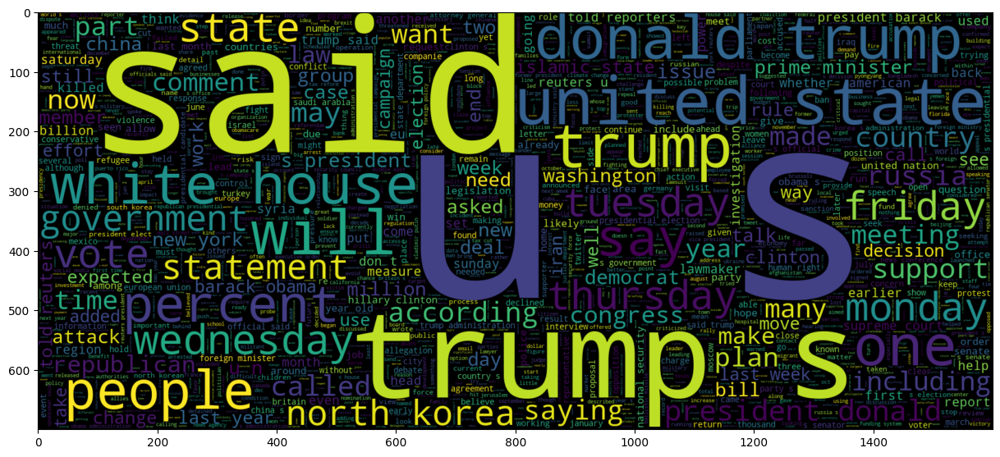

In [29]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(dataset2[dataset2.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

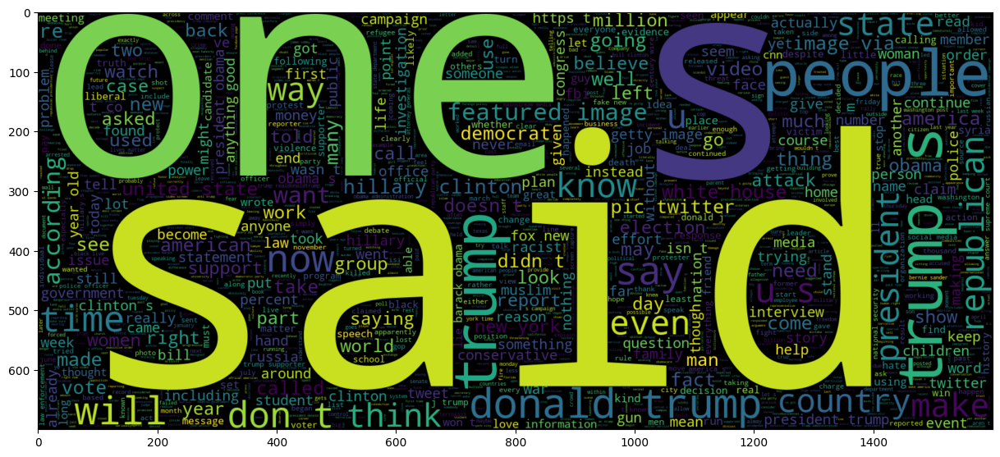

In [30]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(dataset2[dataset2.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 3

In [31]:
dataset3_fake = pd.read_csv("Downloads/Fake_news_Detection-main/politifact_3/politifact_fake.csv")
dataset3_real = pd.read_csv("Downloads/Fake_news_Detection-main/politifact_3/politifact_real.csv")

In [32]:
dataset3_fake["label"] = 0
dataset3_real["label"] = 1

In [33]:
dataset3 = pd.concat([dataset3_fake, dataset3_real])

In [34]:
dataset3["Article"] = dataset3["title"]

In [35]:
dataset3 = dataset3.loc[:,['Article','label']]

In [36]:
dataset3.sample(frac = 1).head()

,Article,label
473,Top Picks (Most Requested Statistics) : U.S. B...,1
316,TSA: Frequently Asked Questions,1
229,Noted and Quoted,1
91,Queen Elizabeth Says: “Muslim Refugees Are Div...,0
288,WE CALLED IT! Gloria Allred Accuser **ADMITS**...,0


In [37]:
dataset3.isnull().sum()

Article    0
label      0
dtype: int64

In [38]:
dataset3.shape

(1056, 2)

In [39]:
##  Applying the wordpre method to the dataset
dataset3['Article']=dataset3['Article'].apply(wordpre)

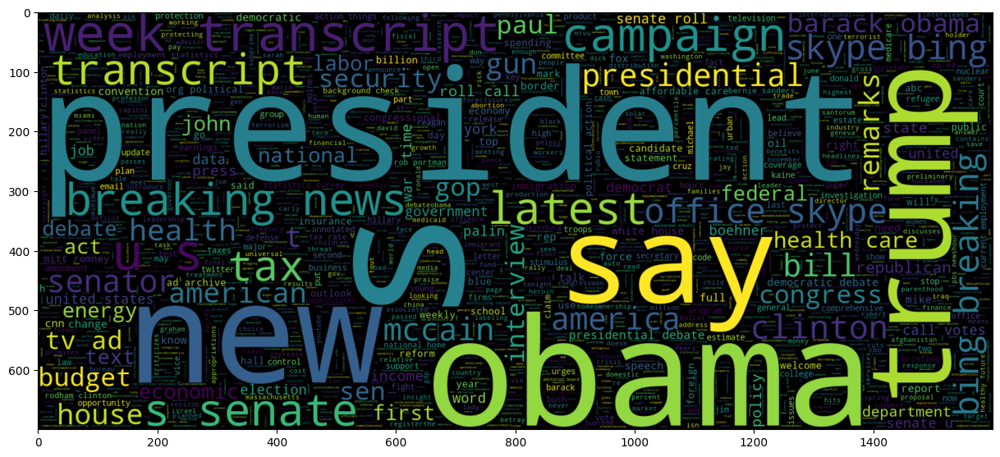

In [40]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(dataset3[dataset3.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

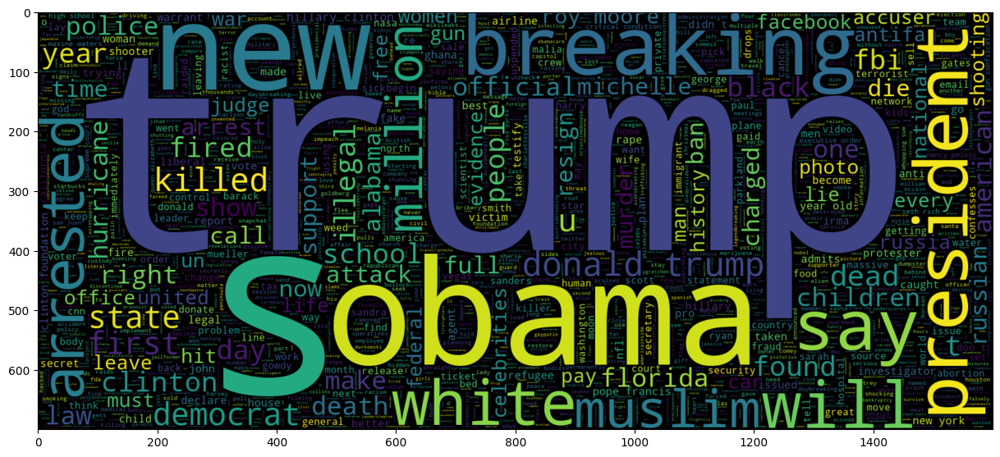

In [41]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(dataset3[dataset3.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 4

In [42]:
dataset4 = pd.read_csv("Downloads/Fake_news_Detection-main/Data_set_4/train.csv")

In [43]:
dataset4["Article"] = dataset4["title"] + dataset4["text"]

In [44]:
dataset4 = dataset4.loc[:, ['Article','label']]

In [45]:
dataset4.head()

,Article,label
0,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",0
2,Why the Truth Might Get You FiredWhy the Truth...,1
3,15 Civilians Killed In Single US Airstrike Hav...,1
4,Iranian woman jailed for fictional unpublished...,1


In [46]:
dataset4.sample(frac = 1)

,Article,label
15141,Why Companies Have Started to Coach New Parent...,0
11402,White House Tech Summit Includes Discussion of...,0
10906,Comment on WikiLeaks List Exposes At Least 65 ...,1
19324,Trump Campaign Admits They Are Trying To Steal...,1
19531,NaN,1
...,...,...
7903,The SPLC’s Libelous New Report on 'Anti-Muslim...,1
19457,Trump Avoids Facts Again: Wind Energy Won’t Ki...,1
18501,Donald Trump’s Remarks Rattle NATO Allies and ...,0
17448,The Vexed Question of the Dollar « SGTreport –...,1


In [47]:
dataset4.isnull().sum()

Article    597
label        0
dtype: int64

In [48]:
dataset4 = dataset4.dropna()

In [49]:
dataset4.isnull().sum()

Article    0
label      0
dtype: int64

In [50]:
##  Applying the wordpre method to the dataset
dataset4['Article']=dataset4['Article'].apply(wordpre)

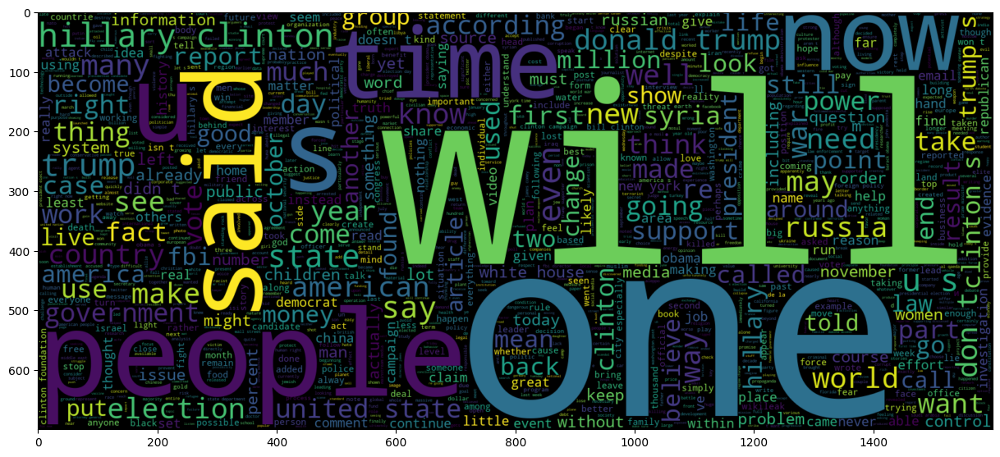

In [51]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(dataset4[dataset4.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

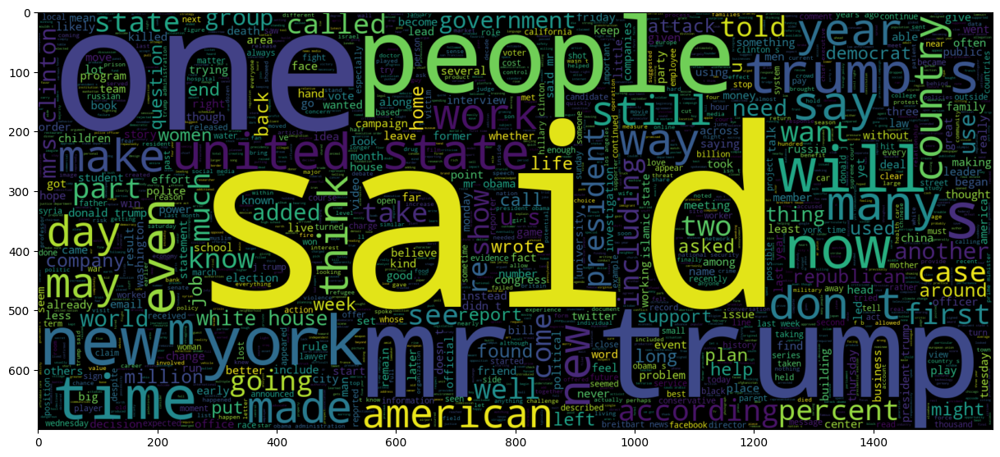

In [52]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(dataset4[dataset4.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 5

In [53]:
dataset5 = pd.read_csv("Downloads/Fake_news_Detection-main/data.csv")

In [54]:
dataset5.sample(5)

,URLs,Headline,Body,Label
445,https://www.reuters.com/article/us-brazil-corr...,Brazil wants $12.7 billion fine on Andrade eng...,SAO PAULO (Reuters) - The Brazilian government...,1
3758,http://beforeitsnews.com/sports/2017/09/cowboy...,Cowboys WR Dez Bryant - Team Done with Anthem ...,Cowboys WR Dez Bryant – Team Done with Anthem ...,0
19,http://beforeitsnews.com/u-s-politics/2017/10/...,"In Meeting With Military, Trump Talks Of 'Calm...","In Meeting With Military, Trump Talks Of 'Calm...",0
325,http://edition.cnn.com/interactive/2017/10/mid...,"Hunting the terror group from 70,000ft",NaN,1
3600,http://www.cnn.com/2017/10/10/politics/judge-j...,Trump's 'so-called judge' to hear contraceptiv...,Washington (CNN) The federal judge who Preside...,1


In [55]:
dataset5["Article"] = dataset5["Headline"] + dataset5["Body"]

In [56]:
dataset5['label'] = dataset5['Label']

In [57]:
dataset5 = dataset5.loc[:,['Article','label']]

In [58]:
dataset5 = dataset5.sample(frac = 1)

In [59]:
dataset5.head()

,Article,label
269,NaN,1
1753,Prankster Arrested After Crashing Theresa May'...,0
3419,Indian court bans firecracker sales in Delhi a...,1
1385,UN Security Council Resolution 2375 on North K...,0
1748,Love Hope Strength Band Announces Partnership ...,0


In [60]:
dataset5.isnull().sum()

Article    21
label       0
dtype: int64

In [61]:
dataset5 = dataset5.dropna()

In [62]:
dataset5.isnull().sum()

Article    0
label      0
dtype: int64

In [63]:
dataset5.shape

(3988, 2)

In [64]:
##  Applying the wordpre method to the dataset
dataset5['Article']=dataset5['Article'].apply(wordpre)

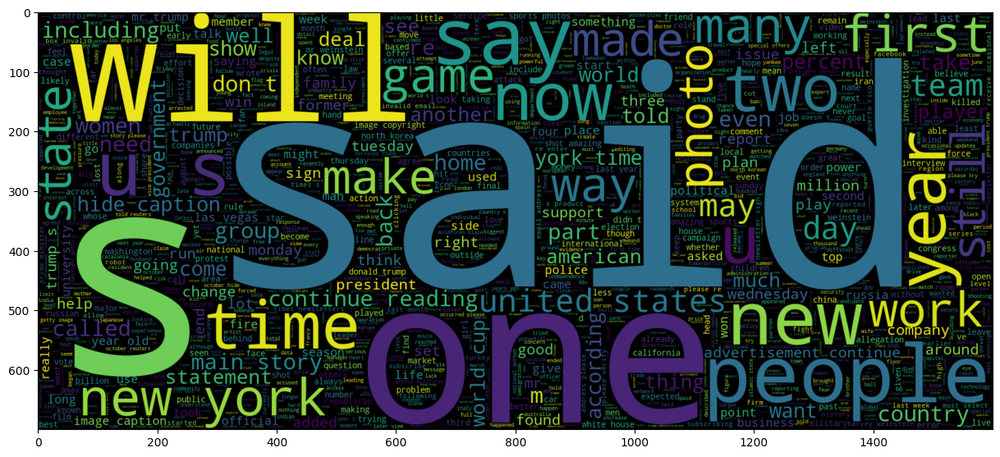

In [65]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(dataset5[dataset5.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

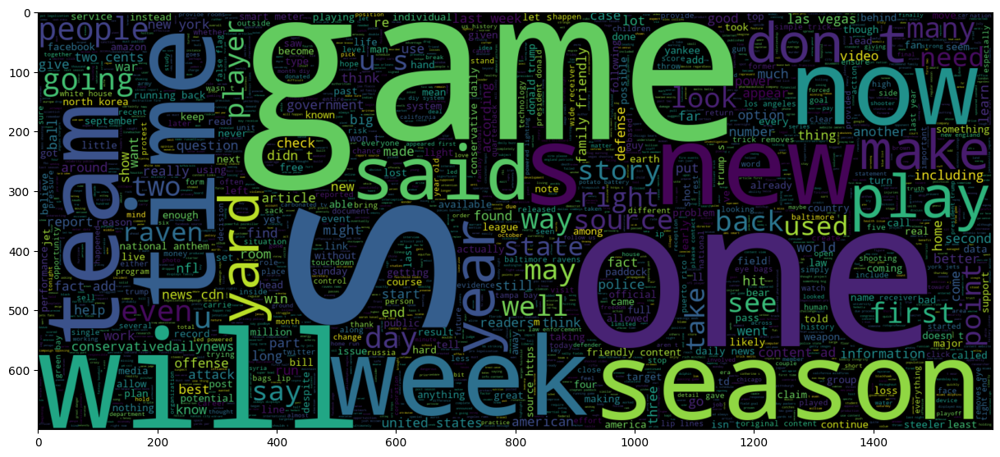

In [66]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(dataset5[dataset5.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

In [ ]:
# All datasets preprocessing completed

In [67]:
Dataset = pd.concat([dataset1, dataset2, dataset3, dataset4,dataset5])

In [68]:
Dataset.shape

(76480, 2)

In [69]:
dataset1.shape[0] + dataset2.shape[0] + dataset3.shape[0] + dataset4.shape[0] + dataset5.shape[0]

76480

In [70]:
Dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 76480 entries, 0 to 3639
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Article  76480 non-null  object
 1   label    76480 non-null  object
dtypes: object(2)
memory usage: 1.8+ MB


In [71]:
Dataset['label'] = Dataset['label'].astype('int')

In [72]:
Dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 76480 entries, 0 to 3639
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Article  76480 non-null  object
 1   label    76480 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 1.8+ MB


In [73]:
x_train,x_test,y_train,y_test = train_test_split(Dataset['Article'], Dataset['label'], test_size=0.2, random_state=42)

In [74]:
#LogisticRegression
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', LogisticRegression())])

Logisticmodel = pipe.fit(x_train, y_train)
prediction = Logisticmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
Logisticmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 87.18%


In [75]:
#DecisionTreeClassifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', DecisionTreeClassifier(criterion= 'entropy',
                                           max_depth = 10, 
                                           splitter='best', 
                                           random_state=42))])
DecisionTreemodel = pipe.fit(x_train, y_train)
prediction = DecisionTreemodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
DecisionTreemodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 81.88%


In [76]:
#RandomForestClassifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', RandomForestClassifier())])

RandomForestmodel = pipe.fit(x_train, y_train) 
prediction = RandomForestmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
RandomForestmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 82.37%


In [77]:
#Stochastic Gradient Descent
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', SGDClassifier())])
SGDmodel = pipe.fit(x_train, y_train)
prediction = SGDmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
SDGmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 86.42%


In [80]:
#GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', GradientBoostingClassifier(loss = 'log_loss',
                                                   learning_rate = 0.01,
                                                   n_estimators = 10,
                                                   max_depth = 5,
                                                   random_state=42))])

GBCmodel = pipe.fit(x_train, y_train)
prediction = GBCmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
GBCmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 80.69%


In [84]:
#XGBClassifier
from xgboost import XGBClassifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', XGBClassifier(
                                        learning_rate = 0.01,
                                        n_estimators = 10,
                                        max_depth = 5,
                                        random_state=2020))])

xgboostmodel = pipe.fit(x_train, y_train)
prediction = xgboostmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
xgboostmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 80.73%


In [85]:
#Multinomial Naive Bayes Classifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', MultinomialNB())])

MNBCmodel = pipe.fit(x_train, y_train)
prediction = MNBCmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
Multinomial_Naive_Bayes_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 78.95%


In [86]:
#Bernoulli Naive Bayes Classifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', BernoulliNB())])

BNBCmodel = pipe.fit(x_train, y_train)
prediction = BNBCmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
Bernoulli_Naive_Bayes_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 76.49%


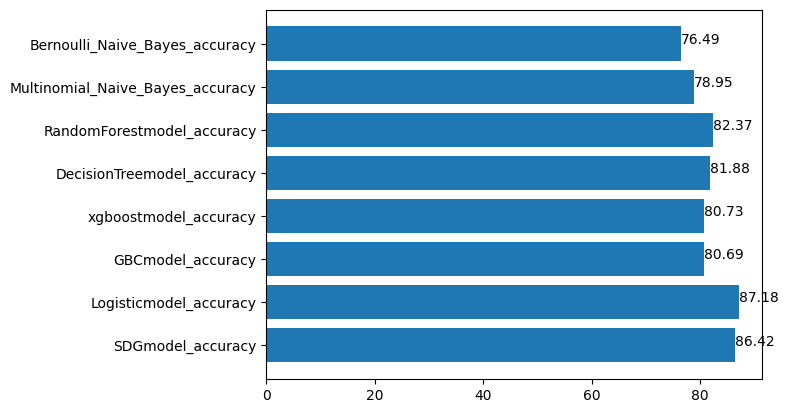

In [87]:
x = ["SDGmodel_accuracy", "Logisticmodel_accuracy", "GBCmodel_accuracy", "xgboostmodel_accuracy" , 
     "DecisionTreemodel_accuracy","RandomForestmodel_accuracy","Multinomial_Naive_Bayes_accuracy",
     "Bernoulli_Naive_Bayes_accuracy"]
y =  [SDGmodel_accuracy,Logisticmodel_accuracy,GBCmodel_accuracy,xgboostmodel_accuracy,
      DecisionTreemodel_accuracy,RandomForestmodel_accuracy,Multinomial_Naive_Bayes_accuracy,
      Bernoulli_Naive_Bayes_accuracy]
plt.barh(x, y)

for index, value in enumerate(y):
    plt.text(value, index, str(value))

In [88]:
import joblib  
# Save the model as a pickle in a file 
joblib.dump(Logisticmodel, 'model.pkl')  

['model.pkl']